In [1]:
import os

subj = "Subj3"

match subj:
    case 'Subj1':
        N_STAGES = 9
        DEFAULT_QSDA_THRESHOLD = 0.4
    case 'Subj2':
        N_STAGES = 8
        DEFAULT_QSDA_THRESHOLD = 0.28
    case 'Subj3':
        N_STAGES = 10
        DEFAULT_QSDA_THRESHOLD = 0.32

DEFAULT_UNIQUE_VALUES_THRESHOLD = 200
subj = f"E:/CourseProject/{subj}"

exp = "exp_hyperparameters"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

In [2]:
import mne
import tqdm
import numpy
import pandas
import sklearn.preprocessing
import sklearn.decomposition
import matplotlib.pyplot as plt

import SDA.analytics

In [3]:
def read_traditional():
    df_ft_psd_loc_db = pandas.read_feather(f'{subj}/src/df_ft_psd_loc_db.feather')
    df_ft_psd_ind_loc_log = pandas.read_feather(f'{subj}/src/df_ft_psd_ind_loc_log.feather')
    df_ft_coh_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_coh_ind_loc.feather')
    df_ft_plv_ind_loc = pandas.read_feather(f'{subj}/src/df_ft_plv_ind_loc.feather')

    result =  pandas.concat([
        df_ft_psd_loc_db,
        df_ft_psd_ind_loc_log,
        df_ft_coh_ind_loc,
        df_ft_plv_ind_loc
    ], axis = 1)

    if subj == "Subj2":
        result = result[:-2]
    return result

epochs = mne.read_epochs(f"{subj}/src/epochs_filt_rr-epo.fif").drop_channels(ch_names = [ "A1", "A2" ])
if subj == "Subj2": # m8 (artifacts at the end)
    epochs = epochs[:-2]
data = epochs.get_data(copy = True)

original_traditional = read_traditional()

Reading E:\CourseProject\Subj3\src\epochs_filt_rr-epo.fif ...
    Found the data of interest:
        t =    -500.00 ...     500.00 ms
        0 CTF compensation matrices available
Not setting metadata
1180 matching events found
No baseline correction applied
0 projection items activated


In [4]:
def run_sda(all_features: pandas.DataFrame, n_components: int, folder: str):
    if os.path.exists(f"{folder}/stats.svg"):
        return
    os.makedirs(folder, exist_ok = True)

    # Scale features
    all_features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    # numpy.save(f"{folder}/all_features.npy", all_features)
    # numpy.savetxt(f"{folder}/all_features_shape.txt", all_features.shape)

    # PCA
    pca = sklearn.decomposition.PCA(n_components = n_components, svd_solver = "full", random_state = 42)
    pca_features = pca.fit_transform(all_features)
    numpy.save(f"{folder}/pca_features.npy", pca_features)
    numpy.savetxt(f"{folder}/pca_features_shape.txt", pca_features.shape)
    
    numpy.savetxt(f"{folder}/explained_variance.txt", [ pca.explained_variance_ratio_.sum() ])
    numpy.savetxt(f"{folder}/explained_variance_ratios.txt", pca.explained_variance_ratio_)

    # SDA
    sda = SDA.SDA(n_jobs = 5, scale = False, verbose = False)
    results, df_st_edges = sda.apply(pca_features)
    
    results.to_csv(f"{folder}/results.csv")
    df_st_edges.to_csv(f"{folder}/df_st_edges.csv")

    # Analyze
    best_results = SDA.analytics.best_results(results, key = 'Avg-Silh')
    best_results.to_csv(f"{folder}/best_results.csv")
    
    best_result = SDA.analytics.best_result(results, key = 'Avg-Silh', n_stages = N_STAGES)
    best_result_df = pandas.DataFrame([ best_result ])
    best_result_df.to_csv(f"{folder}/best_result.csv")
    
    best_edges = numpy.array(best_result['St_edges'])
    numpy.savetxt(f"{folder}/best_edges.txt", best_edges, fmt = "%d", newline = ' ')

    stage_timing = SDA.analytics.stage_timing(best_edges, epochs)
    stage_timing.to_csv(f"{folder}/stage_timing.csv")
    
    SDA.analytics.plot_stats(pca_features, epochs, best_result, df_st_edges).savefig(f"{folder}/stats.svg")


def read_silh_one(folder: str):
    return pandas.read_csv(f"{folder}/best_result.csv")["Avg-Silh"].iloc[0]

### PCA

In [5]:
exp = "exp_hyperparameters/pca"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

N_COMPONENTS = [3, 5, 7, 10, 15, 20, 30, 50, 75, 100, 200, 300, 400, 500, 600, 700]

In [6]:
original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
original_qsda = pandas.read_feather(f"{subj}/exp_full_flow/qsda/best_features.feather")
original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

noise_qsda = numpy.load(f"{subj}/exp_noise/qsda/best_features.npy")
if subj == "Subj2":
    noise_qsda = noise_qsda[:-2]

shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
shuffle_order = shuffle_order[shuffle_order < len(epochs)]
shuffled_traditional = original_traditional.to_numpy()[shuffle_order]
shuffled_qsda = numpy.load(f"{subj}/exp_shuffled/qsda/best_features.npy")
if subj == "Subj2":
    shuffled_qsda = shuffled_qsda[:-2]
shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

In [7]:
def analyze(all_features: pandas.DataFrame, n_components: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{n_components}"
    run_sda(all_features, n_components, folder)

for n_components in tqdm.tqdm(N_COMPONENTS):
    analyze(original_traditional, n_components, "original_traditional")
    analyze(original_topological, n_components, "original_topological")
    analyze(original_qsda, n_components, "original_qsda")
    analyze(original_combined, n_components, "original_combined")
    analyze(noise_qsda, n_components, "noise_qsda")
    analyze(shuffled_traditional, n_components, "shuffled_traditional")
    analyze(shuffled_qsda, n_components, "shuffled_qsda")
    analyze(shuffled_combined, n_components, "shuffled_combined")

100%|██████████| 16/16 [00:01<00:00,  9.79it/s]


### QSDA min_unique_values

In [8]:
exp = "exp_hyperparameters/qsda_min_unique_values"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_MIN_UNIQUE_VALUES = [0, 50, 100, 200, 300, 500, 750, 1000]

  0%|          | 0/8 [00:00<?, ?it/s]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 12%|█▎        | 1/8 [10:24<1:12:50, 624.37s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 25%|██▌       | 2/8 [17:55<52:13, 522.24s/it]  

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 38%|███▊      | 3/8 [25:07<40:06, 481.23s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 50%|█████     | 4/8 [32:04<30:24, 456.02s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 62%|██████▎   | 5/8 [39:07<22:12, 444.12s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 75%|███████▌  | 6/8 [46:05<14:30, 435.20s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


 88%|████████▊ | 7/8 [52:57<07:07, 427.39s/it]

Using threshold 0.32
Using threshold 0.32
Using threshold 0.32


100%|██████████| 8/8 [59:35<00:00, 446.98s/it]


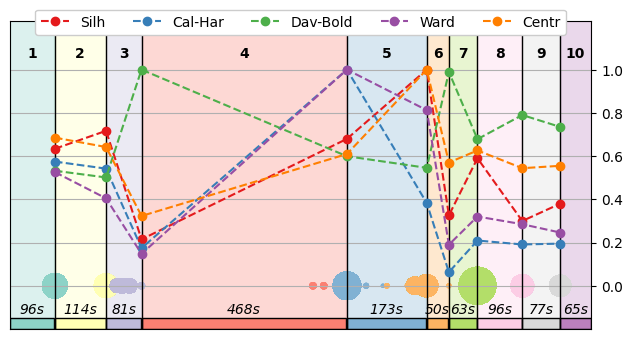

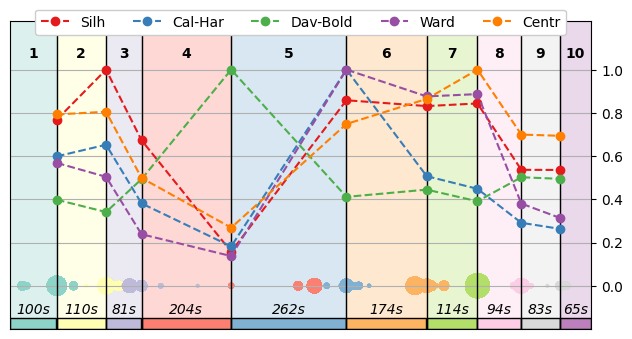

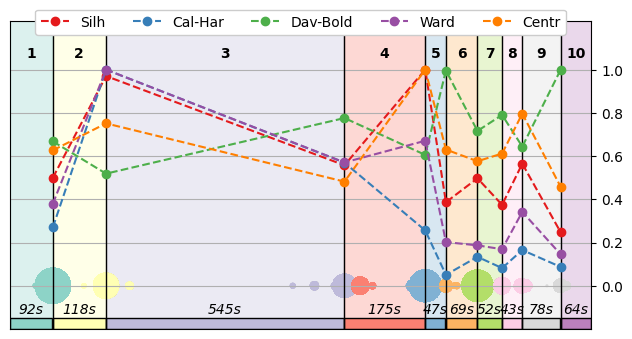

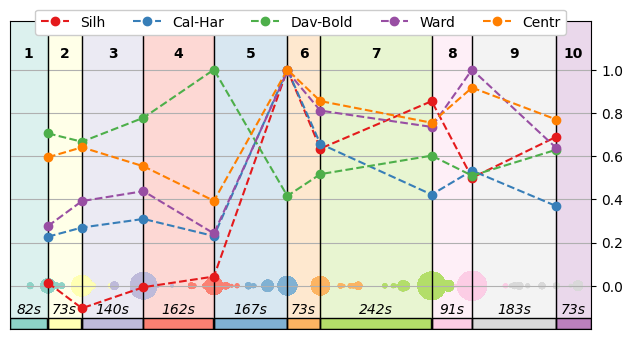

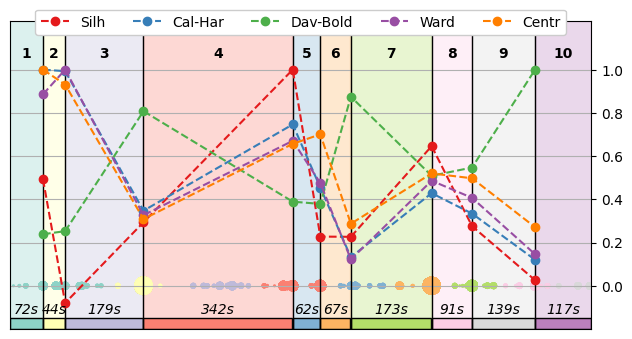

...

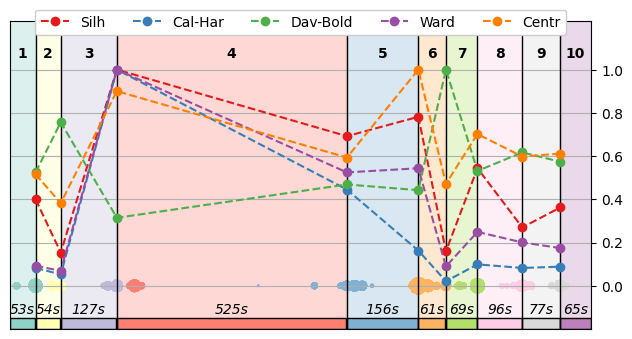

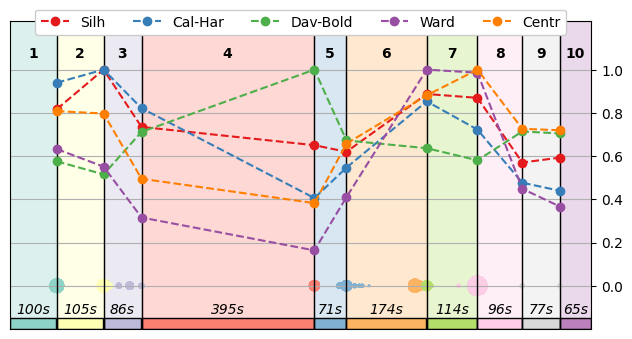

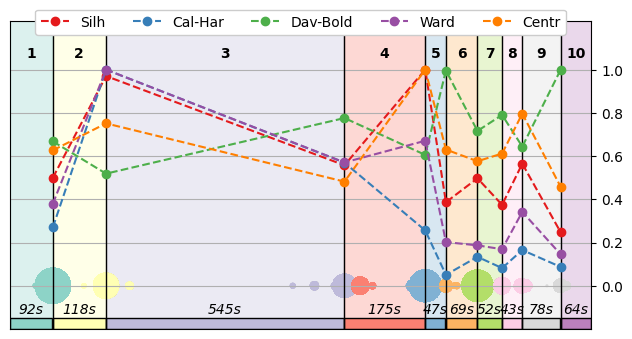

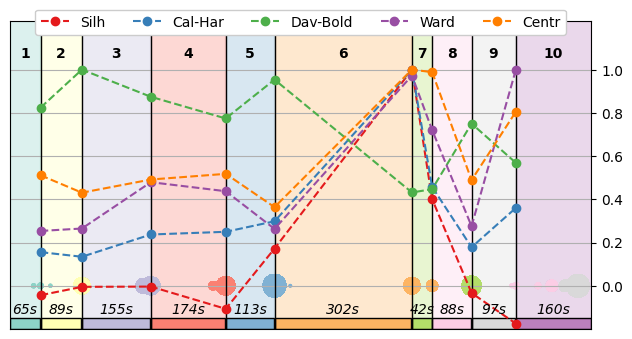

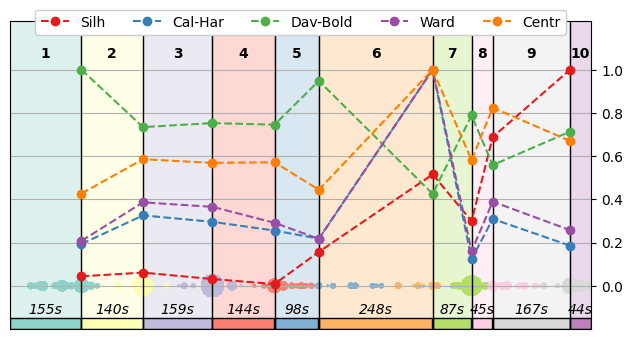

In [9]:
def process_qsda(features: pandas.DataFrame, folder: str, min_unique_values: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = min_unique_values
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, min_unique_values: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{min_unique_values}"
    run_sda(all_features, 15, folder)

for min_unique_values in tqdm.tqdm(TRY_MIN_UNIQUE_VALUES):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", min_unique_values)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", min_unique_values)
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", min_unique_values)
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, min_unique_values, "original_traditional")
    # analyze(original_topological, min_unique_values, "original_topological")
    analyze(original_qsda, min_unique_values, "original_qsda")
    analyze(original_combined, min_unique_values, "original_combined")
    analyze(noise_qsda, min_unique_values, "noise_qsda")
    # analyze(shuffled_traditional, min_unique_values, "shuffled_traditional")
    analyze(shuffled_qsda, min_unique_values, "shuffled_qsda")
    analyze(shuffled_combined, min_unique_values, "shuffled_combined")

### QSDA threshold

In [10]:
exp = "exp_hyperparameters/qsda_threshold"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [100, 250, 500, 750, 1000, 1250, 1500, 1750, 2000, 2500, 3000, 4000]

  0%|          | 0/12 [00:00<?, ?it/s]

Using threshold 0.5876090115054072
Using threshold 0.4972870361802043
Using threshold 0.4652686559676741


  8%|▊         | 1/12 [06:42<1:13:46, 402.40s/it]

Using threshold 0.5147020571234975
Using threshold 0.4191317538529055
Using threshold 0.3899258010993068


 17%|█▋        | 2/12 [13:16<1:06:15, 397.51s/it]

Using threshold 0.4516498099175764
Using threshold 0.3330612587788471
Using threshold 0.3303186458703602


 25%|██▌       | 3/12 [20:01<1:00:10, 401.13s/it]

Using threshold 0.4121724857317645
Using threshold 0.2827132392321056
Using threshold 0.2872133585109739


 33%|███▎      | 4/12 [27:04<54:37, 409.65s/it]  

Using threshold 0.3807817885912481
Using threshold 0.2429266664782454
Using threshold 0.2536250303466428


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))
 42%|████▏     | 5/12 [34:08<48:24, 414.88s/it]

Using threshold 0.3563382835590123
Using threshold 0.2130746308577577
Using threshold 0.2275841767349865


 50%|█████     | 6/12 [41:36<42:37, 426.17s/it]

Using threshold 0.3316382371383886
Using threshold 0.1906260904759746
Using threshold 0.2094707649577767


 58%|█████▊    | 7/12 [49:12<36:18, 435.67s/it]

Using threshold 0.3125166337022912
Using threshold 0.1749361124687447
Using threshold 0.1954263510728963


 67%|██████▋   | 8/12 [56:42<29:21, 440.40s/it]

Using threshold 0.2949428836652273
Using threshold 0.1598510709966139
Using threshold 0.1810585135753418


 75%|███████▌  | 9/12 [1:04:47<22:43, 454.40s/it]

Using threshold 0.2634155702326122
Using threshold 0.1269938197194684
Using threshold 0.1582043345993685


 83%|████████▎ | 10/12 [1:12:50<15:26, 463.10s/it]

Using threshold 0.2412465273232978
Using threshold 0.0981256024432458
Using threshold 0.1422261000209699


 92%|█████████▏| 11/12 [1:19:48<07:29, 449.22s/it]

Using threshold 0.2028644084916408
Using threshold 0.0586270386077252
Using threshold 0.1165539032617207


100%|██████████| 12/12 [1:26:40<00:00, 433.40s/it]


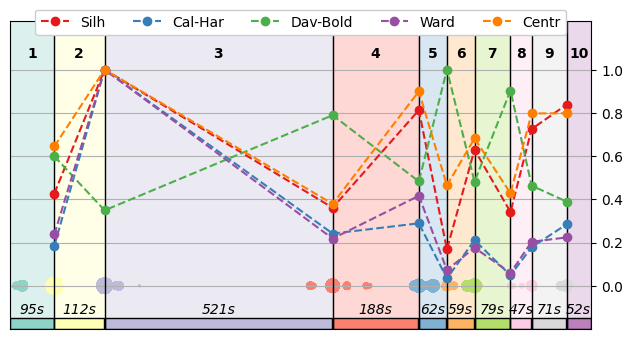

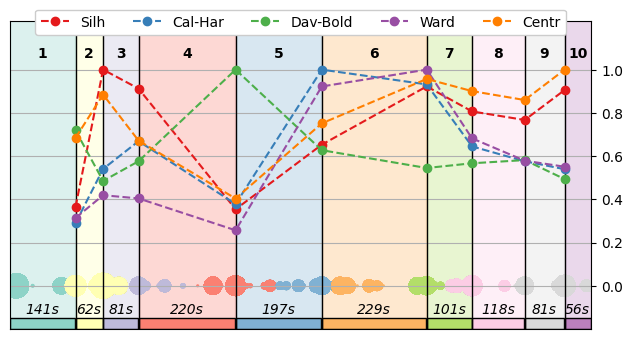

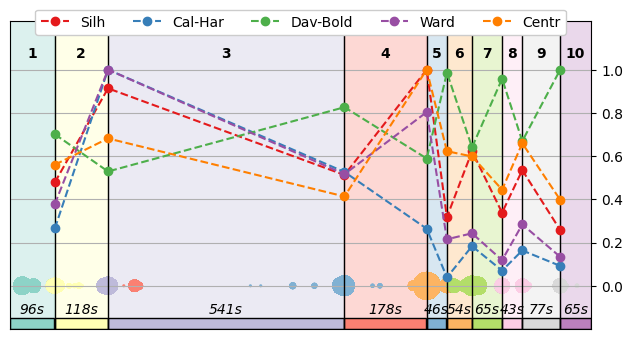

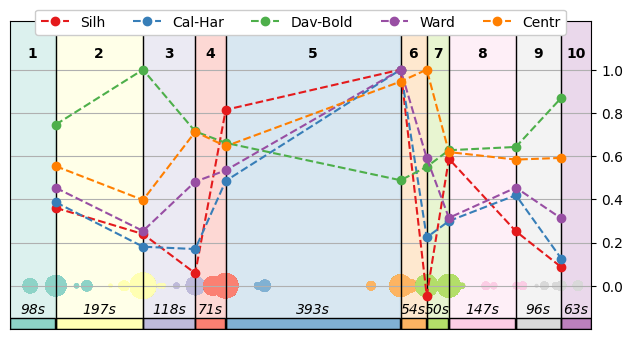

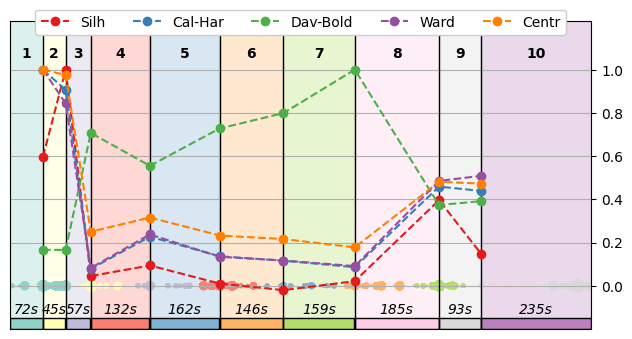

...

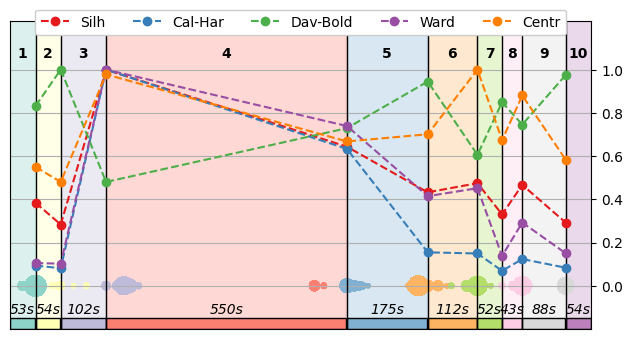

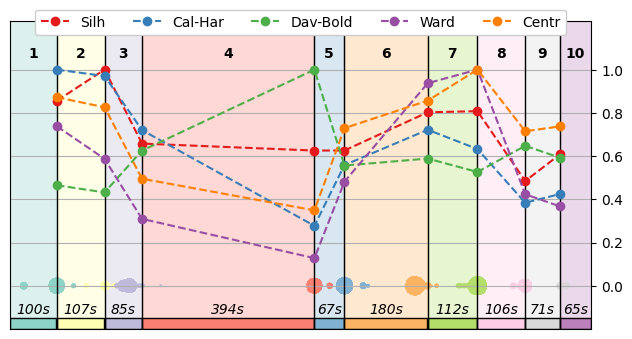

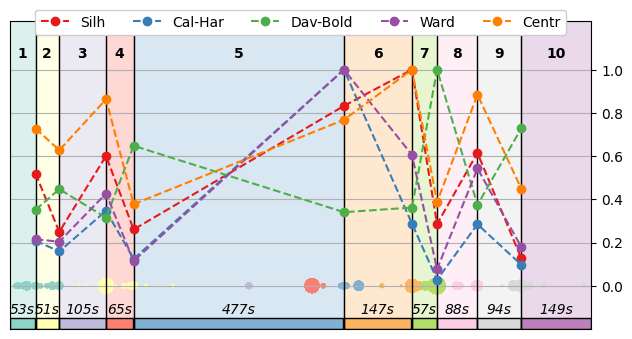

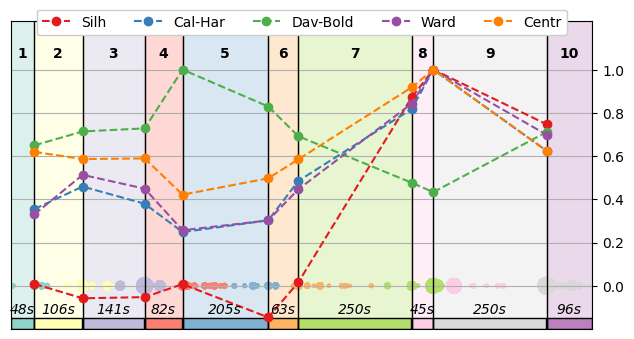

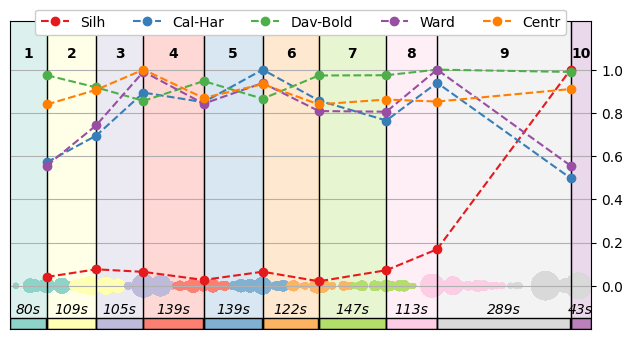

In [11]:
def process_qsda(features: pandas.DataFrame, folder: str, threshold: int):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = threshold,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in tqdm.tqdm(TRY_THRESHOLDS):
    original_topological = pandas.read_feather(f"{subj}/exp_full_flow/features/features.feather")
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda", threshold)
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = pandas.read_feather(f"{subj}/exp_noise/features/features.feather")
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda", threshold)
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda", threshold)
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    # analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")

### Filtering

In [12]:
exp = "exp_hyperparameters/filtering"
os.makedirs(f"{subj}/{exp}", exist_ok = True)

TRY_THRESHOLDS = [5, 10, 15, 20, 25, 35, 40, 45, 50]

TRYING: 5
Filtered diagrams: (44840, 197, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:27<00:00, 1636.40it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:27<00:00, 1631.55it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:25<00:00, 1731.16it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:42<00:00,  3.28s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:13<00:00, 611.42it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 60, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:38<00:00, 740.51it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:39<00:00, 724.98it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:41<00:00, 675.09it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:13<00:00,  1.02s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:43<00:00, 272.72it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 530, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 898.32it/s] 


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 897.33it/s] 


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 907.14it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.56it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:03<00:00, 368.41it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 188, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5668.97it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5495.28it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:43<00:00,  3.35s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:19<00:00, 2471.67it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 449, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 2565.62it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 2563.72it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.48it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 1598.20it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 197, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:32<00:00, 1458.29it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:31<00:00, 1492.82it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:27<00:00, 1717.13it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:45<00:00,  3.50s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:16<00:00, 614.88it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 68, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:37<00:00, 746.92it/s] 


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 739.02it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:38<00:00, 741.19it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:12<00:00,  1.08it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:28<00:00, 319.80it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 522, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1108.57it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1175.76it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1167.74it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.15it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 460.44it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 10
Filtered diagrams: (44840, 188, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:27<00:00, 1643.80it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:25<00:00, 1756.12it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:26<00:00, 1689.68it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:49<00:00,  3.79s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:21<00:00, 548.59it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 59, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:49<00:00, 572.52it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:44<00:00, 642.46it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:40<00:00, 703.93it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:11<00:00,  1.16it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:40<00:00, 281.23it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 490, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:00<00:00, 1195.88it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1084.17it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 1517.93it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.96it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 431.22it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 186, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5466.46it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5649.80it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.07s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:20<00:00, 2301.45it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 430, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 3419.89it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 2588.53it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.39it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 1977.87it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 190, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:28<00:00, 1656.34it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:27<00:00, 1707.82it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:28<00:00, 1667.00it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:42<00:00,  3.30s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:16<00:00, 617.27it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 62, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:39<00:00, 722.84it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:36<00:00, 773.92it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:37<00:00, 757.63it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:09<00:00,  1.31it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:30<00:00, 314.46it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 491, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:00<00:00, 1451.16it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1176.07it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1015.30it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:03<00:00,  3.51it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 471.95it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 15
Filtered diagrams: (44840, 180, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:28<00:00, 1564.68it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:36<00:00, 1234.18it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:27<00:00, 1609.90it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:45<00:00,  3.50s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:21<00:00, 552.58it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 54, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:42<00:00, 663.58it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 732.58it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:37<00:00, 748.37it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:11<00:00,  1.11it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:29<00:00, 316.47it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 469, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1125.21it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1092.31it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1065.72it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.17it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 455.49it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 180, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5637.46it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:07<00:00, 6134.21it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:37<00:00,  2.85s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:19<00:00, 2454.80it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 412, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 3174.23it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 3234.66it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.86it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 2149.75it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 180, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:28<00:00, 1671.83it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:27<00:00, 1692.96it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:26<00:00, 1762.44it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:49<00:00,  3.77s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:15<00:00, 627.18it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 59, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:39<00:00, 710.47it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:37<00:00, 763.58it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:37<00:00, 754.84it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:09<00:00,  1.37it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:29<00:00, 318.16it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 460, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1117.67it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1166.91it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1102.96it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.48it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 451.33it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 20
Filtered diagrams: (44840, 177, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:31<00:00, 1427.12it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:29<00:00, 1538.91it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:26<00:00, 1723.39it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.01s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:12<00:00, 617.91it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 50, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:38<00:00, 741.23it/s] 


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 734.90it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:38<00:00, 730.48it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.54it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:28<00:00, 319.56it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 437, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1089.71it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 1559.04it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 1540.75it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.72it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 473.34it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 176, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5808.88it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:07<00:00, 6140.26it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:44<00:00,  3.46s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:18<00:00, 2568.40it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 388, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 2574.57it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 2727.59it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  6.01it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 1439.59it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 177, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:29<00:00, 1622.67it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:28<00:00, 1680.26it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:26<00:00, 1748.94it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.04s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:15<00:00, 622.85it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 56, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:38<00:00, 729.30it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 738.15it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:38<00:00, 733.12it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:09<00:00,  1.39it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:46<00:00, 266.98it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 436, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1110.54it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1051.93it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 981.84it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.27it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 440.74it/s]


Features: (1180, 291)
Using threshold 0.32


d:\TopoEEG\SDA\analytics\plot_stats.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize = (7.5, 4))


TRYING: 25
Filtered diagrams: (44840, 174, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:27<00:00, 1611.11it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:26<00:00, 1661.67it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:26<00:00, 1700.63it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:37<00:00,  2.91s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:11<00:00, 628.38it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 49, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:38<00:00, 732.77it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:37<00:00, 751.47it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:39<00:00, 725.68it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.52it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:30<00:00, 313.52it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 410, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1115.30it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1089.72it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1108.05it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.81it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 450.83it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 173, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:06<00:00, 7417.66it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5513.01it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:36<00:00,  2.81s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:19<00:00, 2411.70it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 369, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 4730.12it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 4586.29it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.90it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 2788.06it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 174, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:29<00:00, 1627.17it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:28<00:00, 1647.35it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:28<00:00, 1685.60it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:40<00:00,  3.14s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:19<00:00, 596.73it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 53, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:41<00:00, 682.01it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:47<00:00, 602.50it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:41<00:00, 678.35it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:10<00:00,  1.25it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:35<00:00, 295.09it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 410, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1144.72it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1152.73it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1114.15it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.59it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:03<00:00, 379.73it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 35
Filtered diagrams: (44840, 165, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:25<00:00, 1739.56it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:26<00:00, 1684.23it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:24<00:00, 1804.52it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:38<00:00,  2.93s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:11<00:00, 626.49it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 45, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:39<00:00, 719.52it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 727.84it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:39<00:00, 723.66it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.68it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:28<00:00, 321.38it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 356, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1148.70it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1130.03it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1110.16it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.67it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 442.82it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 168, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5869.83it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5666.60it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:35<00:00,  2.76s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:19<00:00, 2418.09it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 317, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 3327.59it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 3199.68it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  8.30it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 2075.47it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 165, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:26<00:00, 1759.04it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:40<00:00, 1174.30it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:33<00:00, 1415.42it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:48<00:00,  3.76s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:23<00:00, 565.29it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 47, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:44<00:00, 642.09it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:41<00:00, 685.42it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:43<00:00, 655.46it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.62it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:27<00:00, 322.06it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 362, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1172.38it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 965.52it/s] 


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 830.85it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  4.83it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 430.80it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 40
Filtered diagrams: (44840, 164, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:26<00:00, 1685.52it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:26<00:00, 1689.07it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:25<00:00, 1772.81it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:36<00:00,  2.78s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:17<00:00, 580.98it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 39, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:39<00:00, 717.14it/s] 


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:38<00:00, 736.35it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:38<00:00, 728.01it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  1.87it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:40<00:00, 281.27it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 337, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 903.89it/s] 


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 937.70it/s] 


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 931.12it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:02<00:00,  5.90it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:05<00:00, 220.36it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 165, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:08<00:00, 5493.84it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5326.87it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:41<00:00,  3.22s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:19<00:00, 2458.92it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 290, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 1867.62it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 2637.39it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  6.81it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 1305.23it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 165, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:31<00:00, 1494.73it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:32<00:00, 1461.30it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:32<00:00, 1474.43it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:39<00:00,  3.05s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [01:20<00:00, 587.15it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 42, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:39<00:00, 724.07it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:37<00:00, 745.99it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:37<00:00, 746.37it/s] 


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:07<00:00,  1.79it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:28<00:00, 320.15it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 334, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1096.40it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1124.10it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1085.34it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.31it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 457.46it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 45
Filtered diagrams: (44840, 160, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:26<00:00, 1691.59it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:26<00:00, 1684.39it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:26<00:00, 1701.42it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:35<00:00,  2.75s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [01:13<00:00, 613.41it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 39, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:46<00:00, 608.42it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:48<00:00, 587.91it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:40<00:00, 696.73it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:08<00:00,  1.52it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:35<00:00, 295.71it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 300, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:01<00:00, 1109.31it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:01<00:00, 1136.17it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:01<00:00, 1095.38it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  7.52it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:02<00:00, 468.55it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 161, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:09<00:00, 5196.28it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:08<00:00, 5337.87it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:36<00:00,  2.80s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:18<00:00, 2575.61it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 271, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 4780.79it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 5321.66it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 10.87it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 2930.36it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 160, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:19<00:00, 2374.59it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:19<00:00, 2406.08it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:19<00:00, 2466.92it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:32<00:00,  2.47s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:54<00:00, 864.04it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 40, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:28<00:00, 1010.79it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:27<00:00, 1022.21it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:27<00:00, 1037.90it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.00it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:03<00:00, 447.71it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 310, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:00<00:00, 1591.73it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 1637.30it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 1490.73it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  8.67it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:01<00:00, 623.70it/s]


Features: (1180, 291)
Using threshold 0.32
TRYING: 50
Filtered diagrams: (44840, 155, 3)
Calculating Betti features


 betti: 100%|██████████| 44840/44840 [00:18<00:00, 2419.76it/s]


Calculating landscape features


 landscape: 100%|██████████| 44840/44840 [00:18<00:00, 2431.96it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 44840/44840 [00:18<00:00, 2389.59it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:29<00:00,  2.28s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 44840/44840 [00:51<00:00, 863.43it/s]


Features: (1180, 7980)
Filtered diagrams: (28320, 36, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:27<00:00, 1022.87it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:27<00:00, 1039.49it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:27<00:00, 1030.87it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.13it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:03<00:00, 443.16it/s]


Features: (1180, 10872)
Filtered diagrams: (1180, 281, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:00<00:00, 1619.07it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 1343.58it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 1651.41it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  9.63it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:01<00:00, 609.86it/s]


Features: (1180, 291)
Using threshold 0.32
Filtered diagrams: (47200, 156, 3)
Skipping Betti features
Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:05<00:00, 7888.41it/s] 


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:06<00:00, 7587.20it/s] 


Calculating entropy features
Skipping number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:28<00:00,  2.18s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:13<00:00, 3394.73it/s]


Features: (1180, 4720)
Filtered diagrams: (1180, 243, 3)
Skipping Betti features
Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 4760.68it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 4376.36it/s]


Calculating entropy features
Skipping number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00, 11.96it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:00<00:00, 2907.96it/s]


Features: (1180, 160)
Using threshold 0.32
Filtered diagrams: (47200, 155, 3)
Calculating Betti features


 betti: 100%|██████████| 47200/47200 [00:20<00:00, 2348.03it/s]


Calculating landscape features


 landscape: 100%|██████████| 47200/47200 [00:19<00:00, 2430.44it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 47200/47200 [00:19<00:00, 2415.13it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:30<00:00,  2.38s/it]


Calculating lifetime features


 lifetime: 100%|██████████| 47200/47200 [00:54<00:00, 870.65it/s]


Features: (1243, 7980)
Filtered diagrams: (28320, 39, 3)
Calculating Betti features


 betti: 100%|██████████| 28320/28320 [00:27<00:00, 1016.37it/s]


Calculating landscape features


 landscape: 100%|██████████| 28320/28320 [00:27<00:00, 1024.19it/s]


Calculating silhouette features


 silhouette-2: 100%|██████████| 28320/28320 [00:27<00:00, 1025.99it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


 amplitudes: 100%|██████████| 13/13 [00:06<00:00,  2.02it/s]


Calculating lifetime features


 lifetime: 100%|██████████| 28320/28320 [01:03<00:00, 444.77it/s]


Features: (1288, 9966)
Filtered diagrams: (1180, 279, 3)
Calculating Betti features


overall betti: 100%|██████████| 1180/1180 [00:00<00:00, 1634.18it/s]


Calculating landscape features


overall landscape: 100%|██████████| 1180/1180 [00:00<00:00, 1626.27it/s]


Calculating silhouette features


overall silhouette-2: 100%|██████████| 1180/1180 [00:00<00:00, 1654.80it/s]


Calculating entropy features
Calculating number of points features
Calculating amplitude features


overall amplitudes: 100%|██████████| 13/13 [00:01<00:00,  9.91it/s]


Calculating lifetime features


overall lifetime: 100%|██████████| 1180/1180 [00:01<00:00, 647.41it/s]


Features: (1180, 291)
Using threshold 0.32


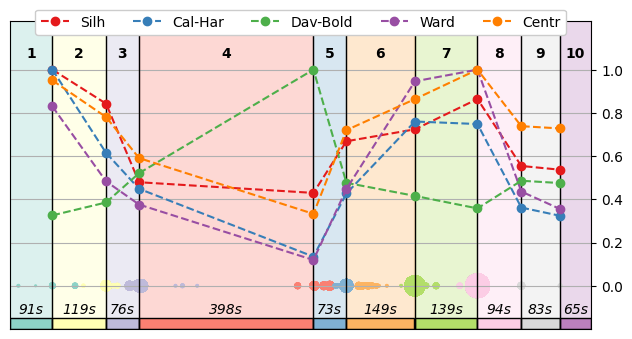

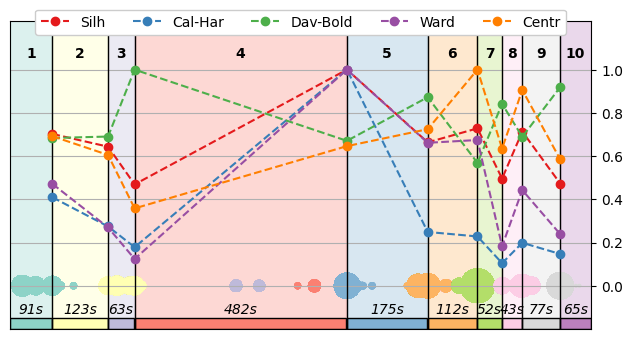

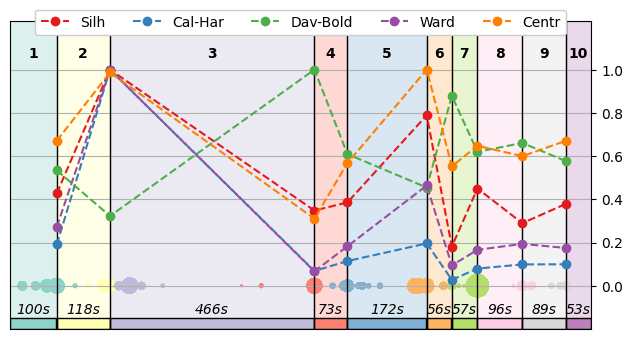

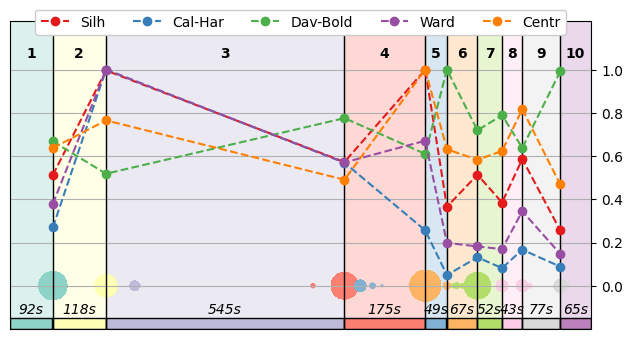

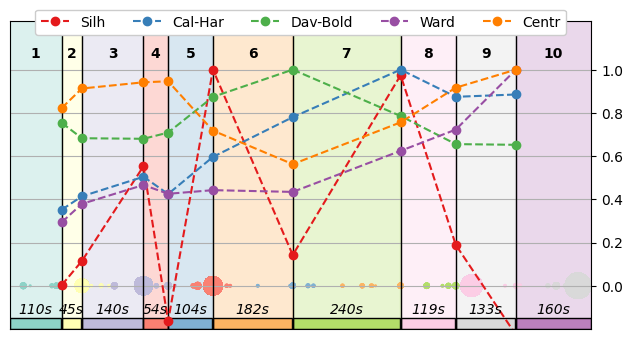

...

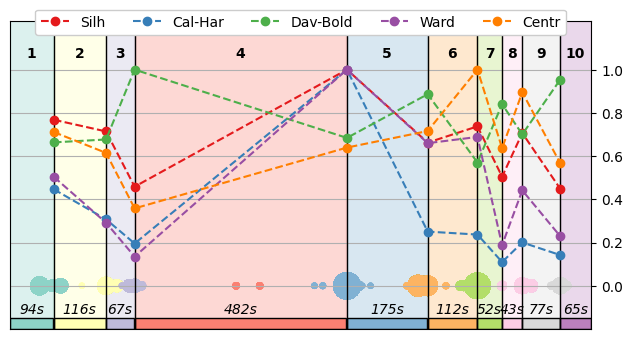

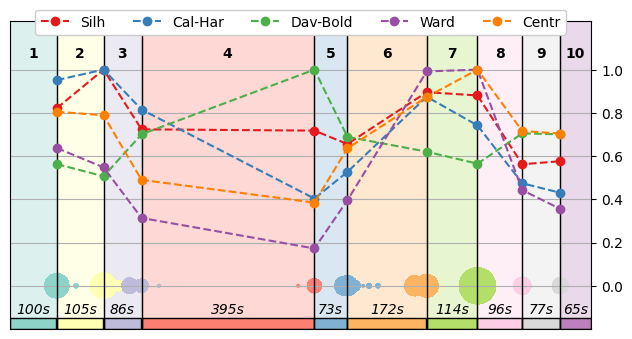

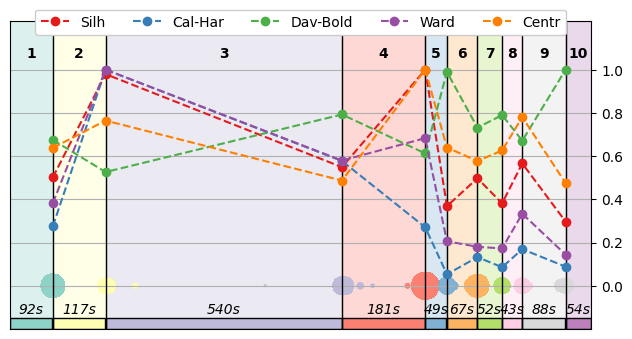

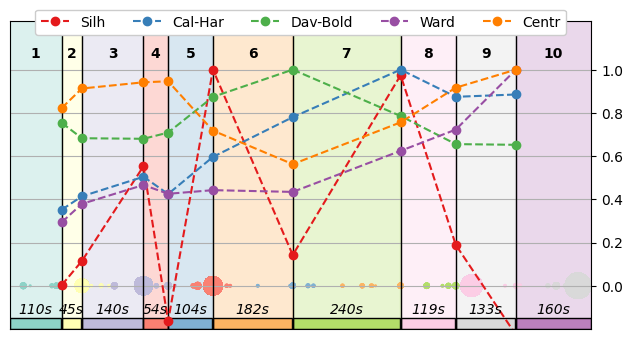

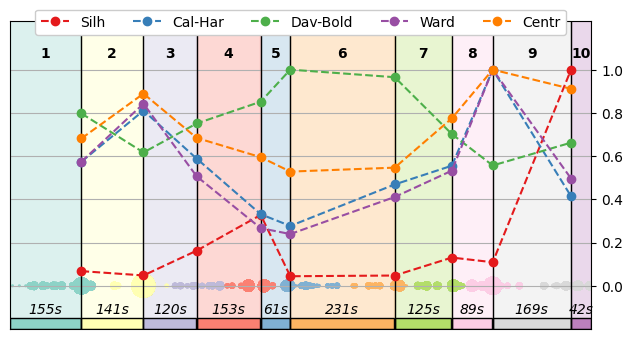

In [13]:
import SDA.topology
import sklearn.preprocessing

def make_features(src_exp: str, threshold: float, reduced: bool = False, n_channels: int = 38):
    folder = f"{subj}/{src_exp}/features"
    
    diagrams = numpy.load(f'{folder}/per_channel/diagrams.npy')
    per_channel_extractor = SDA.topology.PerChannelFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
    per_channel_features = per_channel_extractor.calculate_features(n_channels, diagrams)

    if not reduced:
        diagrams = numpy.load(f'{folder}/dissimilarity/diagrams.npy')
        dissimilarity_extractor = SDA.topology.DissimilarityFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
        dissimilarity_features = dissimilarity_extractor.calculate_features(len(per_channel_features), diagrams)

    diagrams = numpy.load(f'{folder}/overall/diagrams.npy')
    overall_extractor = SDA.topology.OverallFeatureExtractor(n_jobs = 5, folder = None, reduced = reduced, filtering_percentile = threshold)
    overall_features = overall_extractor.calculate_features(diagrams)

    if reduced:
        all_features = pandas.concat([per_channel_features, overall_features], axis = 1).fillna(0)
    else:
        all_features = pandas.concat([per_channel_features, dissimilarity_features, overall_features], axis = 1).fillna(0)
    
    features = sklearn.preprocessing.StandardScaler().fit_transform(all_features)
    return pandas.DataFrame(features, columns = all_features.columns)

def process_qsda(features: pandas.DataFrame, folder: str):
    qsda = SDA.QSDA(
        n_jobs = 1,
        qsda_n_jobs = 5,
        scores_folder = folder,

        threshold = DEFAULT_QSDA_THRESHOLD,
        min_unique_values = DEFAULT_UNIQUE_VALUES_THRESHOLD
    )
    return qsda.select(features)[0]
    
def analyze(all_features: pandas.DataFrame, threshold: int, folder: str):
    folder = f"{subj}/{exp}/{folder}/{threshold}"
    run_sda(all_features, 15, folder)

for threshold in TRY_THRESHOLDS:
    print(f"TRYING: {threshold}")

    original_topological = make_features("exp_full_flow", threshold)
    original_qsda = process_qsda(original_topological, f"{subj}/exp_full_flow/qsda")
    original_combined = pandas.concat([ original_traditional, original_qsda ], axis = 1)

    noise_topological = make_features("exp_noise", threshold, reduced = True, n_channels = 40)
    noise_qsda = process_qsda(noise_topological, f"{subj}/exp_noise/qsda")
    if subj == "Subj2":
        noise_qsda = noise_qsda[:-2]

    shuffle_order = numpy.load(f"{subj}/exp_shuffled/shuffle_order.npy")
    shuffle_order = shuffle_order[shuffle_order < len(epochs)]
    shuffled_traditional = original_traditional.to_numpy()[shuffle_order]

    shuffled_topological = make_features("exp_shuffled", threshold)
    shuffled_topological = pandas.read_feather(f"{subj}/exp_shuffled/features/features.feather")
    shuffled_qsda = process_qsda(shuffled_topological, f"{subj}/exp_shuffled/qsda")
    if subj == "Subj2":
        shuffled_qsda = shuffled_qsda[:-2]
    shuffled_combined = numpy.concatenate([ shuffled_traditional, shuffled_qsda ], axis = 1)

    # analyze(original_traditional, threshold, "original_traditional")
    analyze(original_topological, threshold, "original_topological")
    analyze(original_qsda, threshold, "original_qsda")
    analyze(original_combined, threshold, "original_combined")
    analyze(noise_qsda, threshold, "noise_qsda")
    # analyze(shuffled_traditional, threshold, "shuffled_traditional")
    analyze(shuffled_qsda, threshold, "shuffled_qsda")
    analyze(shuffled_combined, threshold, "shuffled_combined")